# Coffee Shop Analysis


In [ ]:
# Read in the data
data = spark.read.csv("/FileStore/tables/coffee_Full.csv", inferSchema = True, header = True)

In [ ]:
from pyspark.sql.dataframe import *
from pyspark.sql.functions import *
from pyspark.ml.feature import *

In [ ]:
display(data)

_c0,transaction_id,age,income,sex,rewards_member,occupation,num_items,purchase_method,wait_time,purchase_amount,store_location,transaction_time,day_of_week
1,1,48,$50K-$75K,Female,false,Retired,3,Credit Card,4.37041779796359,15.19,Uptown,22,Saturday
2,2,32,$25K-$50K,Female,false,Retired,3,Cash,2.30796121678142,12.41,Midtown,20,Friday
3,3,68,$75K-$100K,Female,false,Self Employed,4,Mobile Payment,3.89939822873409,18.16,Midtown,12,Friday
4,4,31,$25K-$50K,Female,false,Employed,4,Mobile Payment,1.87190761759261,15.41,Downtown,14,Sunday
5,5,20,Under $25K,Female,false,Student,1,Credit Card,2.66648236799237,6.23,Uptown,18,Wednesday
6,6,59,$75K-$100K,Female,true,Employed,5,Credit Card,2.50637046034456,21.72,Midtown,13,Monday
7,7,67,$75K-$100K,Male,true,Self Employed,3,Credit Card,0.966888079743862,13.08,Uptown,12,Saturday
8,8,71,Over $100K,Female,false,Retired,3,Credit Card,3.42676111896725,14.96,Downtown,13,Saturday
9,9,60,$75K-$100K,Male,true,Retired,6,Credit Card,2.94511204259134,19.27,Downtown,11,Wednesday
10,10,54,$75K-$100K,Male,true,Employed,3,Credit Card,0.853794802025569,13.38,Midtown,16,Friday


## Exploratory Data Analysis

In [ ]:
# Drop unnecessary column
data = data.drop('_c0')

In [ ]:
# Explore "income" and convert into categorical variable (0 thru 4 levels)
data.select('income').distinct().collect()

Out[5]: [Row(income='$25K-$50K'),
 Row(income='$75K-$100K'),
 Row(income='$50K-$75K'),
 Row(income='Under $25K'),
 Row(income='Over $100K')]

In [ ]:
# Use StringIndexer to convert the string column "income" to a categorical variable
indexer = StringIndexer(inputCol='income', outputCol='income_cat')
data = indexer.fit(data).transform(data)

In [ ]:
display(data)

transaction_id,age,income,sex,rewards_member,occupation,num_items,purchase_method,wait_time,purchase_amount,store_location,transaction_time,day_of_week,income_cat
1,48,$50K-$75K,Female,false,Retired,3,Credit Card,4.37041779796359,15.19,Uptown,22,Saturday,0.0
2,32,$25K-$50K,Female,false,Retired,3,Cash,2.30796121678142,12.41,Midtown,20,Friday,2.0
3,68,$75K-$100K,Female,false,Self Employed,4,Mobile Payment,3.89939822873409,18.16,Midtown,12,Friday,1.0
4,31,$25K-$50K,Female,false,Employed,4,Mobile Payment,1.87190761759261,15.41,Downtown,14,Sunday,2.0
5,20,Under $25K,Female,false,Student,1,Credit Card,2.66648236799237,6.23,Uptown,18,Wednesday,4.0
6,59,$75K-$100K,Female,true,Employed,5,Credit Card,2.50637046034456,21.72,Midtown,13,Monday,1.0
7,67,$75K-$100K,Male,true,Self Employed,3,Credit Card,0.966888079743862,13.08,Uptown,12,Saturday,1.0
8,71,Over $100K,Female,false,Retired,3,Credit Card,3.42676111896725,14.96,Downtown,13,Saturday,3.0
9,60,$75K-$100K,Male,true,Retired,6,Credit Card,2.94511204259134,19.27,Downtown,11,Wednesday,1.0
10,54,$75K-$100K,Male,true,Employed,3,Credit Card,0.853794802025569,13.38,Midtown,16,Friday,1.0


In [ ]:
data.printSchema()

root
 |-- transaction_id: integer (nullable = true)
 |-- age: integer (nullable = true)
 |-- income: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- rewards_member: boolean (nullable = true)
 |-- occupation: string (nullable = true)
 |-- num_items: integer (nullable = true)
 |-- purchase_method: string (nullable = true)
 |-- wait_time: double (nullable = true)
 |-- purchase_amount: double (nullable = true)
 |-- store_location: string (nullable = true)
 |-- transaction_time: integer (nullable = true)
 |-- day_of_week: string (nullable = true)
 |-- income_cat: double (nullable = false)



Group by day of the week and check the total and average purchase amount per day

In [ ]:
data_agg = data.groupBy('day_of_week').agg(sum('purchase_amount').alias('sum_purchase_amount'))
display(data_agg)

day_of_week,sum_purchase_amount
Wednesday,4645533.919999994
Tuesday,4662967.979999999
Friday,6201038.010000006
Thursday,4638813.119999994
Saturday,3102193.3199999975
Monday,6510725.839999983
Sunday,1232678.2899999993


Output can only be rendered in Databricks

In [ ]:
data_agg = data.groupBy('day_of_week').agg(avg('purchase_amount').alias('avg_purchase_amount'))
display(data_agg)

day_of_week,avg_purchase_amount
Wednesday,17.1443425374401
Tuesday,17.195293037388858
Friday,17.1649804711829
Thursday,17.160514503235042
Saturday,17.182573237400494
Monday,17.176022307872874
Sunday,17.14935224474463


Group by rewards member and get the average purchase amount, as well as respective percent of total

In [ ]:
data_rewards = data.groupBy('rewards_member').agg(avg('purchase_amount'))
display(data_rewards)                              

rewards_member,avg(purchase_amount)
true,23.215712213523762
false,14.139928084831444


Output can only be rendered in Databricks

Output can only be rendered in Databricks

Group by rewards member and get the average transaction time

In [ ]:
data_time = data.groupBy('rewards_member').agg(avg('transaction_time'))
display(data_time)                              

rewards_member,avg(transaction_time)
true,14.502563328061182
false,14.50494609064687


Group by purchase method and get the average transaction time

In [ ]:
method_timing = data.groupBy('purchase_method').agg(avg('transaction_time'))
display(method_timing)    

purchase_method,avg(transaction_time)
Mobile Payment,14.494228376157443
Credit Card,14.502471476677508
Cash,14.521716420780086


Group by income level and get the total number of customers by level

In [ ]:
income_spending = data.groupBy('income_cat').count()
display(income_spending)

income_cat,count
0.0,486561
1.0,472925
4.0,72375
3.0,300935
2.0,472408


Output can only be rendered in Databricks

Group by income level and get the average purchase amount

In [ ]:
income_expenditures = data.groupBy('income_cat').agg(avg('purchase_amount'))
display(income_expenditures)  

income_cat,avg(purchase_amount)
0.0,15.526005269637267
1.0,16.780390590474227
4.0,17.801344110535414
3.0,16.769928290162337
2.0,19.40844558093843


Output can only be rendered in Databricks

Group by occupation and get the total number of customers

In [ ]:
occupation_transaction = data.groupBy('occupation').agg(count('transaction_id'))
display(occupation_transaction)  

occupation,count(transaction_id)
Employed,816409
Self Employed,401397
Student,166384
Retired,421014


Output can only be rendered in Databricks

Group by store and get the total purchase amount

In [ ]:
store_purchase = data.groupBy('store_location').agg(sum('purchase_amount'))
display(store_purchase)

store_location,sum(purchase_amount)
Midtown,9313947.979999933
Uptown,9312606.69999998
Downtown,1.236739579999994E7


Output can only be rendered in Databricks

Group by income level and get the total number of reward members

In [ ]:
income_reward = data.groupBy('income_cat').agg(sum(col('rewards_member').cast("integer")).alias('reward_count'))
display(income_reward)

income_cat,reward_count
0.0,136742
1.0,203377
4.0,25368
3.0,129334
2.0,107716


Output can only be rendered in Databricks

## Model to Predict Purchase Amount

In [ ]:
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler
from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator
import numpy as np

In [ ]:
# Specify the columns to scale
columns_to_scale = ["age", "transaction_time", "wait_time"]

# Combine selected columns into a vector column
assembler = VectorAssembler(inputCols=columns_to_scale, outputCol="numeric_features")
df_assembled = assembler.transform(data)

# Scale
scaler = StandardScaler(inputCol="numeric_features", outputCol="scaled_numeric_features",
                        withStd=True, withMean=True)
scaler_model = scaler.fit(df_assembled)
df_scaled = scaler_model.transform(df_assembled)

# Create scaled dataframe
df_final = df_scaled.drop("numeric_features")

In [ ]:
display(df_final)

transaction_id,age,income,sex,rewards_member,occupation,num_items,purchase_method,wait_time,purchase_amount,store_location,transaction_time,day_of_week,income_cat,scaled_numeric_features
1,48,$50K-$75K,Female,false,Retired,3,Credit Card,4.37041779796359,15.19,Uptown,22,Saturday,0.0,"Map(vectorType -> dense, length -> 3, values -> List(-0.054425725769636224, 1.4451783144181665, 0.5753559323779336))"
2,32,$25K-$50K,Female,false,Retired,3,Cash,2.30796121678142,12.41,Midtown,20,Friday,2.0,"Map(vectorType -> dense, length -> 3, values -> List(-0.9338370576957965, 1.059584028432626, -0.592022929751098))"
3,68,$75K-$100K,Female,false,Self Employed,4,Mobile Payment,3.89939822873409,18.16,Midtown,12,Friday,1.0,"Map(vectorType -> dense, length -> 3, values -> List(1.044838439138064, -0.4827931155095365, 0.30875236176968845))"
4,31,$25K-$50K,Female,false,Employed,4,Mobile Payment,1.87190761759261,15.41,Downtown,14,Sunday,2.0,"Map(vectorType -> dense, length -> 3, values -> List(-0.9888002659411815, -0.09719882952399592, -0.8388352792050332))"
5,20,Under $25K,Female,false,Student,1,Credit Card,2.66648236799237,6.23,Uptown,18,Wednesday,4.0,"Map(vectorType -> dense, length -> 3, values -> List(-1.5933955566404168, 0.6739897424470852, -0.389095014871099))"
6,59,$75K-$100K,Female,true,Employed,5,Credit Card,2.50637046034456,21.72,Midtown,13,Monday,1.0,"Map(vectorType -> dense, length -> 3, values -> List(0.550169564929599, -0.28999597251676623, -0.4797205622249612))"
7,67,$75K-$100K,Male,true,Self Employed,3,Credit Card,0.966888079743862,13.08,Uptown,12,Saturday,1.0,"Map(vectorType -> dense, length -> 3, values -> List(0.9898752308926791, -0.4827931155095365, -1.3510888160493544))"
8,71,Over $100K,Female,false,Retired,3,Credit Card,3.42676111896725,14.96,Downtown,13,Saturday,3.0,"Map(vectorType -> dense, length -> 3, values -> List(1.2097280638742192, -0.28999597251676623, 0.04123324091463773))"
9,60,$75K-$100K,Male,true,Retired,6,Credit Card,2.94511204259134,19.27,Downtown,11,Wednesday,1.0,"Map(vectorType -> dense, length -> 3, values -> List(0.605132773174984, -0.6755902585023068, -0.23138677729826723))"
10,54,$75K-$100K,Male,true,Employed,3,Credit Card,0.853794802025569,13.38,Midtown,16,Friday,1.0,"Map(vectorType -> dense, length -> 3, values -> List(0.2753535237026739, 0.28839545646154463, -1.4151011705695886))"


In [ ]:
# Converting categorical variables to numerical variables using one-hot encoding
stringIndexer = StringIndexer(inputCols=["sex", "purchase_method", "store_location", "occupation", "day_of_week"], outputCols=["sexIndex", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "day_of_weekIndex"])

encoder = OneHotEncoder(inputCols=["sexIndex", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "day_of_weekIndex"], outputCols=["sexVec", "purchase_methodVec", "store_locationVec", "occupationVec", "day_of_weekVec"])

assembler = VectorAssembler(inputCols=["income_cat", "sexVec", "rewards_member","purchase_methodVec", "occupationVec", "store_locationVec", "day_of_weekVec", "scaled_numeric_features"], outputCol="features")

# Creating a pipeline to assemble all the stages
pipeline = Pipeline(stages=[stringIndexer, encoder, assembler])

data_encoded = pipeline.fit(df_final).transform(df_final)

# Splitting the data into training and test sets
train_data, test_data = data_encoded.randomSplit([0.8, 0.2])

In [ ]:
# Training a linear regression model on the training data
lr = LinearRegression(featuresCol="features", labelCol="purchase_amount")
lr_model = lr.fit(train_data)

# Making predictions on the test data
predictions = lr_model.transform(test_data)

# Calculating the root mean squared error (RMSE)
evaluator = RegressionEvaluator(labelCol="purchase_amount", predictionCol="prediction", metricName="rmse")
rmse_purchase = evaluator.evaluate(predictions)
print(rmse_purchase)

7.13205994493634


Cross-validation did not improve the model

In [ ]:
lr_model.summary

Out[16]: <pyspark.ml.regression.LinearRegressionTrainingSummary at 0x7f30de771a90>

In [ ]:
# Get coefficients
coefficients = np.array(lr_model.coefficients)
features = np.array(["incomeCat","sexFemale","rewardsMember","paymentCreditCard","paymentMobile","occupationEmployed",
                     "occupationRetired", "occupationSelfEmployed","locationDowntown","locationMidtown","Monday","Friday",
                     "Tuesday","Wednesday","Thursday", "Saturday","age","transactionTime","waitTime"])

for i in range(len(features)):
    print(features[i] + ": " + str(coefficients[i]))

incomeCat: 0.5958369599327137
sexFemale: -0.014966731795275526
rewardsMember: 9.624178939556144
paymentCreditCard: -0.015300166786748042
paymentMobile: 0.010021820561861258
occupationEmployed: -1.083100090701517
occupationRetired: -1.1008325094432074
occupationSelfEmployed: -1.0500123929476621
locationDowntown: -0.013390897874336201
locationMidtown: -0.005413335139771421
Monday: 0.01941510756414924
Friday: 0.011701526497996106
Tuesday: 0.018537422475403537
Wednesday: -0.0094086442551367
Thursday: 0.019558578159798726
Saturday: 0.0025004184239965505
age: -1.695776062358374
transactionTime: 0.004178189791497731
waitTime: 0.010877080974623308


In [ ]:
coefficients = coefficients.astype(float)

abs_coeffs = np.abs(coefficients)
sorted_indices = np.argsort(abs_coeffs)[::-1]

sorted_coeffs = abs_coeffs[sorted_indices]
sorted_features = features[sorted_indices]

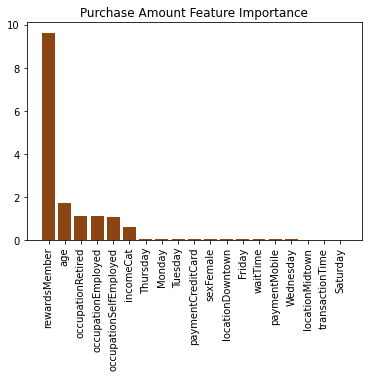

In [ ]:
import matplotlib.pyplot as plt
# Plot feature importance
plt.figure()
plt.title("Purchase Amount Feature Importance")
plt.bar(sorted_features, sorted_coeffs, color = "saddlebrown")
plt.xticks(rotation=90)
plt.show()

In [ ]:
coefficients = coefficients.astype(float)

sorted_indices = np.argsort(coefficients)[::-1]

sorted_coeffs = coefficients[sorted_indices]
sorted_features = features[sorted_indices]

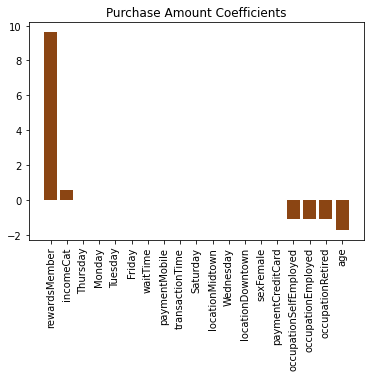

In [ ]:
import matplotlib.pyplot as plt
# Plot feature coefficients
plt.figure()
plt.title("Purchase Amount Coefficients")
plt.bar(sorted_features, sorted_coeffs, color = "saddlebrown")
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Find R^2
lr_model.summary.r2

Out[22]: 0.3017296503250131

## Model to Predict Wait Time

In [ ]:
# Specify the columns to scale
columns_to_scale = ["age", "transaction_time", "purchase_amount"]

# Combine selected columns into a vector column
assembler = VectorAssembler(inputCols=columns_to_scale, outputCol="numeric_features2")
df_assembled = assembler.transform(data)

# Scale
scaler = StandardScaler(inputCol="numeric_features2", outputCol="scaled_numeric_features2",
                        withStd=True, withMean=True)
scaler_model = scaler.fit(df_assembled)
df_scaled = scaler_model.transform(df_assembled)

# Create final scaled dataframe
df_final_wait = df_scaled.drop("numeric_features2")

In [ ]:
# Converting categorical variables to numerical variables using one-hot encoding
stringIndexer = StringIndexer(inputCols=["sex", "purchase_method", "store_location", "occupation", "day_of_week"], outputCols=["sexIndex", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "day_of_weekIndex"])

encoder = OneHotEncoder(inputCols=["sexIndex", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "day_of_weekIndex"], outputCols=["sexVec", "purchase_methodVec", "store_locationVec", "occupationVec", "day_of_weekVec"])

assembler = VectorAssembler(inputCols=["income_cat", "sexVec", "rewards_member", "purchase_methodVec", "occupationVec", "store_locationVec", "day_of_weekVec", "scaled_numeric_features2"], outputCol="features")

# Creating a pipeline to assemble all the stages
pipeline = Pipeline(stages=[stringIndexer, encoder, assembler])

# Fitting and transforming the pipeline on the data
data_encoded_wait = pipeline.fit(df_final_wait).transform(df_final_wait)

# Splitting the data into training and test sets
train_data_wait, test_data_wait = data_encoded_wait.randomSplit([0.8, 0.2])

In [ ]:
display(train_data_wait)

transaction_id,age,income,sex,rewards_member,occupation,num_items,purchase_method,wait_time,purchase_amount,store_location,transaction_time,day_of_week,income_cat,scaled_numeric_features2,sexIndex,purchase_methodIndex,store_locationIndex,occupationIndex,day_of_weekIndex,sexVec,purchase_methodVec,store_locationVec,occupationVec,day_of_weekVec,features
2,32,$25K-$50K,Female,false,Retired,3,Cash,2.30796121678142,12.41,Midtown,20,Friday,2.0,"Map(vectorType -> dense, length -> 3, values -> List(-0.9338370576957965, 1.059584028432626, -0.558218231749988))",0.0,2.0,1.0,1.0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 19, indices -> List(0, 1, 6, 9, 11, 16, 17, 18), values -> List(2.0, 1.0, 1.0, 1.0, 1.0, -0.9338370576957965, 1.059584028432626, -0.558218231749988))"
3,68,$75K-$100K,Female,false,Self Employed,4,Mobile Payment,3.89939822873409,18.16,Midtown,12,Friday,1.0,"Map(vectorType -> dense, length -> 3, values -> List(1.044838439138064, -0.4827931155095365, 0.11621006607652774))",0.0,1.0,1.0,2.0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 19, indices -> List(0, 1, 4, 7, 9, 11, 16, 17, 18), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.044838439138064, -0.4827931155095365, 0.11621006607652774))"
4,31,$25K-$50K,Female,false,Employed,4,Mobile Payment,1.87190761759261,15.41,Downtown,14,Sunday,2.0,"Map(vectorType -> dense, length -> 3, values -> List(-0.9888002659411815, -0.09719882952399592, -0.20634259810137107))",0.0,1.0,0.0,0.0,6.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 19, indices -> List(0, 1, 4, 5, 8, 16, 17, 18), values -> List(2.0, 1.0, 1.0, 1.0, 1.0, -0.9888002659411815, -0.09719882952399592, -0.20634259810137107))"
5,20,Under $25K,Female,false,Student,1,Credit Card,2.66648236799237,6.23,Uptown,18,Wednesday,4.0,"Map(vectorType -> dense, length -> 3, values -> List(-1.5933955566404168, 0.6739897424470852, -1.2830820370661387))",0.0,0.0,2.0,3.0,3.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 3, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 6, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 19, indices -> List(0, 1, 3, 13, 16, 17, 18), values -> List(4.0, 1.0, 1.0, 1.0, -1.5933955566404168, 0.6739897424470852, -1.2830820370661387))"
6,59,$75K-$100K,Female,true,Employed,5,Credit Card,2.50637046034456,21.72,Midtown,13,Monday,1.0,"Map(vectorType -> dense, length -> 3, values -> List(0.550169564929599, -0.28999597251676623, 0.5337691513395529))",0.0,0.0,1.0,0.0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(ve

In [ ]:
metadata = train_data_wait.schema["day_of_weekVec"].metadata
print(metadata)

{'ml_attr': {'attrs': {'binary': [{'idx': 0, 'name': 'Monday'}, {'idx': 1, 'name': 'Friday'}, {'idx': 2, 'name': 'Tuesday'}, {'idx': 3, 'name': 'Wednesday'}, {'idx': 4, 'name': 'Thursday'}, {'idx': 5, 'name': 'Saturday'}]}, 'num_attrs': 6}}


In [ ]:
# Training a linear regression model on the training data
lr_wait = LinearRegression(featuresCol="features", labelCol="wait_time")
lr_model_wait = lr_wait.fit(train_data_wait)

# Making predictions on the test data
wait_predictions = lr_model_wait.transform(test_data_wait)

# Calculating the root mean squared error (RMSE)
evaluator = RegressionEvaluator(labelCol="wait_time", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(wait_predictions)
print(rmse)

1.3458644973306204


In [ ]:
# Find coefficients
import numpy as np
wait_coefficients = np.array(lr_model_wait.coefficients)
features = np.array(["incomeCat","sexFemale","rewardsMember","paymentCreditCard","paymentMobile","occupationEmployed",
                     "occupationRetired", "occupationSelfEmployed","locationDowntown","locationMidtown","Monday","Friday","Tuesday",
                     "Wednesday","Thursday", "Saturday","age","transactionTime","purchaseAmount"])

for i in range(len(features)):
    print(features[i] + ": " + str(wait_coefficients[i]))

incomeCat: 0.002380432306370023
sexFemale: 0.0026571771675675195
rewardsMember: -2.0136623199453263
paymentCreditCard: -1.1950384271461991
paymentMobile: -1.1941413676623034
occupationEmployed: -0.006040726110967735
occupationRetired: -0.009226692039402566
occupationSelfEmployed: -0.00784673594107315
locationDowntown: 0.1766351402256721
locationMidtown: 0.11225084635985678
Monday: 0.26778071357049427
Friday: 0.2705021281523922
Tuesday: 0.2642649542335609
Wednesday: 0.2723504322980681
Thursday: 0.2742414127898182
Saturday: 0.005807569759814352
age: 0.003642889101002752
transactionTime: -0.32429137831437094
purchaseAmount: 0.0013059142495837036


In [ ]:
wait_coefficients = wait_coefficients.astype(float)

abs_coeffs = np.abs(wait_coefficients)
sorted_indices = np.argsort(abs_coeffs)[::-1]

sorted_coeffs = abs_coeffs[sorted_indices]
sorted_features = features[sorted_indices]

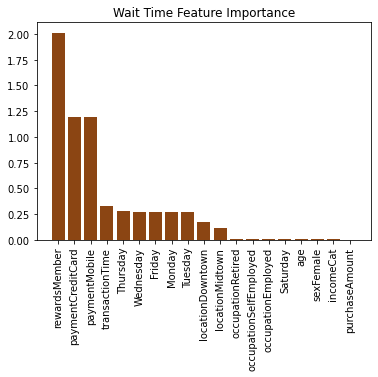

In [ ]:
# Plot feature importance
plt.figure()
plt.title("Wait Time Feature Importance")
plt.bar(sorted_features, sorted_coeffs, color = "saddlebrown")
plt.xticks(rotation=90)
plt.show()

In [ ]:
wait_coefficients = wait_coefficients.astype(float)

sorted_indices = np.argsort(wait_coefficients)[::-1]

sorted_coeffs = wait_coefficients[sorted_indices]
sorted_features = features[sorted_indices]

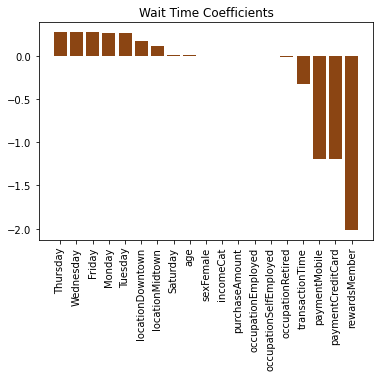

In [ ]:
# Plot feature coefficients
plt.figure()
plt.title("Wait Time Coefficients")
plt.bar(sorted_features, sorted_coeffs, color = "saddlebrown")
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Hyperparameter Tuning
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

lr_wait = LinearRegression(labelCol='wait_time', featuresCol='features')
evaluator = RegressionEvaluator(labelCol="wait_time", predictionCol="prediction", metricName="rmse")

# Define the parameter grid for hyperparameter tuning
paramGrid = ParamGridBuilder() \
    .addGrid(lr_wait.regParam, [0.01, 0.1]) \
    .addGrid(lr_wait.elasticNetParam, [0.0, 0.5, 1.0]) \
    .build()

# Set up the CrossValidator
crossval = CrossValidator(estimator=lr_wait,
                          estimatorParamMaps=paramGrid,
                          evaluator=evaluator,
                          numFolds=5)

# Train the model with the best hyperparameters found through cross-validation
cvModel = crossval.fit(train_data_wait)

# Make predictions on the test data
cvPredictions = cvModel.transform(test_data_wait)

# Calculate RMSE
cvRMSE = evaluator.evaluate(cvPredictions)
print(cvRMSE)

1.3458974260259529


In [ ]:
lr_model_wait.summary.r2

Out[33]: 0.4186359081705966

## Model Comparison

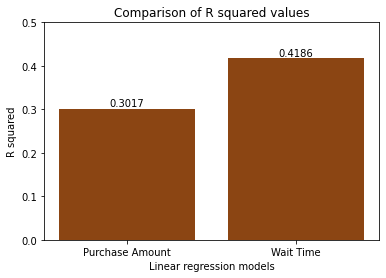

In [ ]:
# Comparison of R^2
x = ['Purchase Amount', 'Wait Time']
y = [lr_model.summary.r2, lr_model_wait.summary.r2]
plt.bar(x, y, color = "saddlebrown")

plt.title('Comparison of R squared values')
plt.xlabel('Linear regression models')
plt.ylabel('R squared')
plt.ylim(0.00, 0.50)

for i in range(len(x)):
    plt.text(x[i], y[i], format(y[i], '.4f'), ha='center', va='bottom')

plt.show()

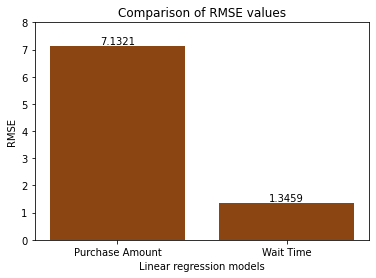

In [ ]:
# Comparison of RMSE
x = ['Purchase Amount', 'Wait Time']
y = [rmse_purchase, cvRMSE]
plt.bar(x, y, color = "saddlebrown")

plt.title('Comparison of RMSE values')
plt.xlabel('Linear regression models')
plt.ylabel('RMSE')
plt.ylim(0, 8)

for i in range(len(x)):
    plt.text(x[i], y[i], format(y[i], '.4f'), ha='center', va='bottom')

plt.show()

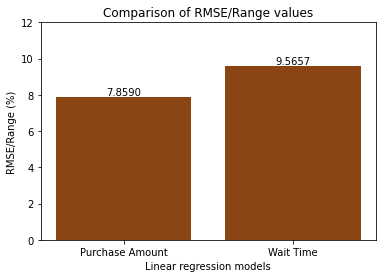

In [ ]:
# Comparison of RMSE/Range
x = ['Purchase Amount', 'Wait Time']
y = [(rmse_purchase/90.75*100), (cvRMSE/14.07*100)]
plt.bar(x, y, color = "saddlebrown")

plt.title('Comparison of RMSE/Range values')
plt.xlabel('Linear regression models')
plt.ylabel('RMSE/Range (%)')
plt.ylim(0, 12)

for i in range(len(x)):
    plt.text(x[i], y[i], format(y[i], '.4f'), ha='center', va='bottom')

plt.show()

**Correlation Matrix**

In [ ]:
assembler = VectorAssembler(inputCols=("age", "sexIndex", "rewards_member", "income_cat", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "num_items", "wait_time", "purchase_amount", "transaction_time", "day_of_weekIndex"), outputCol="features2")
data_assembled = assembler.transform(data_encoded).select("features2")

In [ ]:
from pyspark.ml.stat import Correlation
import seaborn as sns
matrix = Correlation.corr(data_assembled, "features2").head()
corr_matrix = matrix[0].toArray()

In [ ]:
selected_cols = data_encoded.select("age", "sexIndex", "rewards_member", "income_cat", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "num_items", "wait_time", "purchase_amount", "transaction_time", "day_of_weekIndex")

col_names = [col for col in selected_cols]

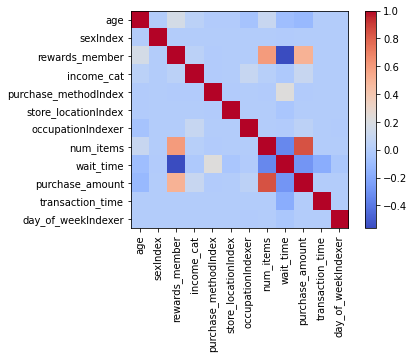

In [ ]:
# Create the correlation plot
fig, ax = plt.subplots()
im = ax.imshow(corr_matrix, cmap='coolwarm', interpolation='nearest')

# Set the x-axis and y-axis ticks and labels
ax.set_xticks(range(len(col_names)))
ax.set_yticks(range(len(col_names)))
ax.set_xticklabels(("age", "sexIndex", "rewards_member", "income_cat", "purchase_methodIndex", "store_locationIndex", "occupationIndexer", "num_items", "wait_time", "purchase_amount", "transaction_time", "day_of_weekIndexer"), rotation=90)
ax.set_yticklabels(("age", "sexIndex", "rewards_member", "income_cat", "purchase_methodIndex", "store_locationIndex", "occupationIndexer", "num_items", "wait_time", "purchase_amount", "transaction_time", "day_of_weekIndexer"))

# Add a color bar legend
palette = sns.color_palette(['#8B4513', '#A0522D', '#CD853F', '#D2691E'])
cbar = ax.figure.colorbar(im, ax=ax)

# Show the plot
plt.show()

## Classification Model for rewards_member

In [ ]:
from pyspark.ml.classification import LogisticRegression

In [ ]:
# Specify the columns to scale
columns_to_scale = ["age", "transaction_time", "purchase_amount", "wait_time"]

# Combine selected columns into a vector column
assembler = VectorAssembler(inputCols=columns_to_scale, outputCol="numeric_features3")
df_assembled = assembler.transform(data)

# Scale
scaler = StandardScaler(inputCol="numeric_features3", outputCol="scaled_numeric_features3",
                        withStd=True, withMean=True)
scaler_model = scaler.fit(df_assembled)
df_scaled = scaler_model.transform(df_assembled)

# Create final scaled dataframe
df_final_rewards = df_scaled.drop("numeric_features3")

In [ ]:
display(df_final_rewards)

transaction_id,age,income,sex,rewards_member,occupation,num_items,purchase_method,wait_time,purchase_amount,store_location,transaction_time,day_of_week,income_cat,scaled_numeric_features3
1,48,$50K-$75K,Female,false,Retired,3,Credit Card,4.37041779796359,15.19,Uptown,22,Saturday,0.0,"Map(vectorType -> dense, length -> 4, values -> List(-0.054425725769636224, 1.4451783144181665, -0.23214681123560305, 0.5753559323779336))"
2,32,$25K-$50K,Female,false,Retired,3,Cash,2.30796121678142,12.41,Midtown,20,Friday,2.0,"Map(vectorType -> dense, length -> 4, values -> List(-0.9338370576957965, 1.059584028432626, -0.558218231749988, -0.592022929751098))"
3,68,$75K-$100K,Female,false,Self Employed,4,Mobile Payment,3.89939822873409,18.16,Midtown,12,Friday,1.0,"Map(vectorType -> dense, length -> 4, values -> List(1.044838439138064, -0.4827931155095365, 0.11621006607652774, 0.30875236176968845))"
4,31,$25K-$50K,Female,false,Employed,4,Mobile Payment,1.87190761759261,15.41,Downtown,14,Sunday,2.0,"Map(vectorType -> dense, length -> 4, values -> List(-0.9888002659411815, -0.09719882952399592, -0.20634259810137107, -0.8388352792050332))"
5,20,Under $25K,Female,false,Student,1,Credit Card,2.66648236799237,6.23,Uptown,18,Wednesday,4.0,"Map(vectorType -> dense, length -> 4, values -> List(-1.5933955566404168, 0.6739897424470852, -1.2830820370661387, -0.389095014871099))"
6,59,$75K-$100K,Female,true,Employed,5,Credit Card,2.50637046034456,21.72,Midtown,13,Monday,1.0,"Map(vectorType -> dense, length -> 4, values -> List(0.550169564929599, -0.28999597251676623, 0.5337691513395529, -0.4797205622249612))"
7,67,$75K-$100K,Male,true,Self Employed,3,Credit Card,0.966888079743862,13.08,Uptown,12,Saturday,1.0,"Map(vectorType -> dense, length -> 4, values -> List(0.9898752308926791, -0.4827931155095365, -0.4796326735684635, -1.3510888160493544))"
8,71,Over $100K,Female,false,Retired,3,Credit Card,3.42676111896725,14.96,Downtown,13,Saturday,3.0,"Map(vectorType -> dense, length -> 4, values -> List(1.2097280638742192, -0.28999597251676623, -0.2591239431486635, 0.04123324091463773))"
9,60,$75K-$100K,Male,true,Retired,6,Credit Card,2.94511204259134,19.27,Downtown,11,Wednesday,1.0,"Map(vectorType -> dense, length -> 4, values -> List(0.605132773174984, -0.6755902585023068, 0.24640405052651593, -0.23138677729826723))"
10,54,$75K-$100K,Male,true,Employed,3,Credit Card,0.853794802025569,13.38,Midtown,16,Friday,1.0,"Map(vectorType -> dense, length -> 4, values -> List(0.2753535237026739, 0.28839545646154463, -0.4444451102036017, -1.4151011705695886))"


In [ ]:
from pyspark.sql.functions import col, when
from pyspark.sql.types import IntegerType

# Converting boolean column to string column
#data = df_final_rewards.withColumn("rewards_member_int", when(col("rewards_member") == True, 1).otherwise(0).cast("double"))
data = df_final_rewards.withColumn("rewards_member",df_final_rewards.rewards_member.cast(IntegerType()))

# Updating the inputCols of the StringIndexer and OneHotEncoder stages in your pipeline to use the new string column
stringIndexer = StringIndexer(inputCols=["sex", "purchase_method", "store_location", "occupation", "day_of_week"], outputCols=["sexIndex", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "day_of_weekIndex"])

encoder = OneHotEncoder(inputCols=["sexIndex", "purchase_methodIndex", "store_locationIndex", "occupationIndex", "day_of_weekIndex"], outputCols=["sexVec", "purchase_methodVec", "store_locationVec", "occupationVec", "day_of_weekVec"])

assembler = VectorAssembler(inputCols=["income_cat", "sexVec", "purchase_methodVec", "occupationVec", "store_locationVec", "day_of_weekVec", "scaled_numeric_features3"], outputCol="features")

# Creating a pipeline to assemble all the stages
pipeline = Pipeline(stages=[stringIndexer, encoder, assembler])

# Fitting and transforming the pipeline on the data
data_encoded_rewards = pipeline.fit(data).transform(data)

# Splitting the data into training and test sets
train_data_rewards, test_data_rewards = data_encoded_rewards.randomSplit([0.8, 0.2])


In [ ]:
# Fit the logistic model
lr = LogisticRegression(labelCol="rewards_member", featuresCol = "features")
lr_model_rewards = lr.fit(train_data_rewards)

In [ ]:
# Make predictions
lr_predictions_rewards = lr_model_rewards.transform(test_data_rewards)

In [ ]:
# Calculate AUC Score
from pyspark.ml.evaluation import BinaryClassificationEvaluator
my_eval = BinaryClassificationEvaluator(labelCol='rewards_member')
AUC = my_eval.evaluate(lr_predictions_rewards)
AUC

Out[43]: 0.9398836527309565

In [ ]:
# Calculate Accuracy
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
my_eval2 = MulticlassClassificationEvaluator(labelCol='rewards_member')
acc = my_eval2.evaluate(lr_predictions_rewards)
acc

Out[44]: 0.8718930067487685

In [ ]:
# Get coefficients
reward_coefficients = np.array(lr_model_rewards.coefficients)
features = np.array(["incomeCat","sexFemale","paymentCreditCard","paymentMobile","occupationEmployed",
                     "occupationRetired", "occupationSelfEmployed","locationDowntown","locationMidtown","Monday","Friday","Tuesday",
                     "Wednesday","Thursday", "Saturday","age","transactionTime","purchaseAmount", "waitTime"])

for i in range(len(features)):
    print(features[i] + ": " + str(reward_coefficients[i]))

incomeCat: -0.07604476950265077
sexFemale: 0.0065645223721343664
paymentCreditCard: -1.280600142301042
paymentMobile: -0.4924087739357959
occupationEmployed: 0.04099181354460197
occupationRetired: -0.0036785131168749967
occupationSelfEmployed: 0.019489615604252428
locationDowntown: 0.26112558447721873
locationMidtown: 0.0933007093237176
Monday: 0.4876538069535428
Friday: 0.493947351470088
Tuesday: 0.4906099313978705
Wednesday: 0.4926035055778196
Thursday: 0.4934028069901775
Saturday: 0.0166370121987212
age: 0.6842629399937716
transactionTime: -0.4617170775403837
purchaseAmount: 1.5394058125144108
waitTime: -2.5473976741234075


In [ ]:
metadata = train_data_rewards.schema["purchase_methodVec"].metadata
print(metadata)

{'ml_attr': {'attrs': {'binary': [{'idx': 0, 'name': 'Credit Card'}, {'idx': 1, 'name': 'Mobile Payment'}]}, 'num_attrs': 2}}


In [ ]:
reward_coefficients = reward_coefficients.astype(float)

abs_coeffs = np.abs(reward_coefficients)
sorted_indices = np.argsort(abs_coeffs)[::-1]

sorted_coeffs = abs_coeffs[sorted_indices]
sorted_features = features[sorted_indices]

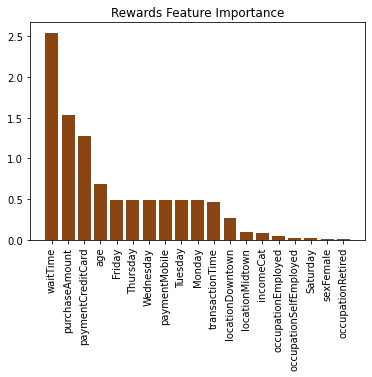

In [ ]:
# Plot feature importance
plt.figure()
plt.title("Rewards Feature Importance")
plt.bar(sorted_features, sorted_coeffs, color = "saddlebrown")
plt.xticks(rotation=90)
plt.show()

In [ ]:
reward_coefficients = reward_coefficients.astype(float)

sorted_indices = np.argsort(reward_coefficients)[::-1]

sorted_coeffs = reward_coefficients[sorted_indices]
sorted_features = features[sorted_indices]

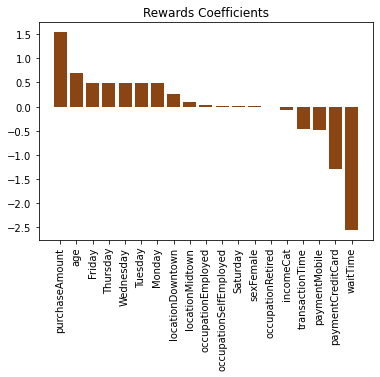

In [ ]:
# Plot feature coefficients
plt.figure()
plt.title("Rewards Coefficients")
plt.bar(sorted_features, sorted_coeffs, color = "saddlebrown")
plt.xticks(rotation=90)
plt.show()